# Snapshots
| Author  | Stanley A. Baronett  |
|---------|----------------------|
| Created |  08/06/2024          |
| Updated |  08/14/2024          |

## BA

### $n_\mathrm{p} = 1$

In [110]:
problem = 'problem1'
subprob = 'a'
base = f'/home/stanley/github/sabaronett/sicc/data/{problem}/{subprob}'
code = 'LA-COMPASS'
times = ['5', '10', '20', '50', '100']
path = f'{base}/{code}'
# time = '5'
for time in times:
    rhop = np.load(f'{path}/old/rhod_{time}p_512x512_BA.npz')
# rhop
    rhop_min = np.min(rhop['rho_d'])
    rhop_max = np.max(rhop['rho_d'])
    print(f'{time}T:')
    print(f'   min = {rhop_min} (ρ/ρ_g0)')
    print(f'   max = {rhop_max} (ρ/ρ_g0)')

5T:
   min = 0.9997464418411255 (ρ/ρ_g0)
   max = 1.0002690553665161 (ρ/ρ_g0)
10T:
   min = 0.9986369013786316 (ρ/ρ_g0)
   max = 1.0013058185577393 (ρ/ρ_g0)
20T:
   min = 0.9965046048164368 (ρ/ρ_g0)
   max = 1.0037378072738647 (ρ/ρ_g0)
50T:
   min = 0.9852312207221985 (ρ/ρ_g0)
   max = 1.0103801488876343 (ρ/ρ_g0)
100T:
   min = 0.9886917471885681 (ρ/ρ_g0)
   max = 1.0087531805038452 (ρ/ρ_g0)


In [4]:
problem = 'problem1'
subprob = 'a'
base = f'/home/stanley/github/sabaronett/sicc/data/{problem}/{subprob}'
code = 'LA-COMPASS'
times = ['5', '10', '20', '50', '100']
path = f'{base}/{code}'

for time in times:
    rhop = np.load(f'{path}/old/rhod_{time}p_512x512_BA.npz')['rho_d']
    np.savez_compressed(f'{path}/rhop{time}', rhop=rhop)

In [41]:
problem = 'problem1'
subprob = 'a'
base = f'/home/stanley/github/sabaronett/sicc/data/{problem}/{subprob}'
code = 'Athena'
times = ['5', '10', '20', '50', '100']
path = f'{base}/{code}'

for time in times:
    rhop = np.load(f'{path}/rhop{time}.npz')['rhop'].T
    np.savez_compressed(f'rhop{time}', rhop=rhop)

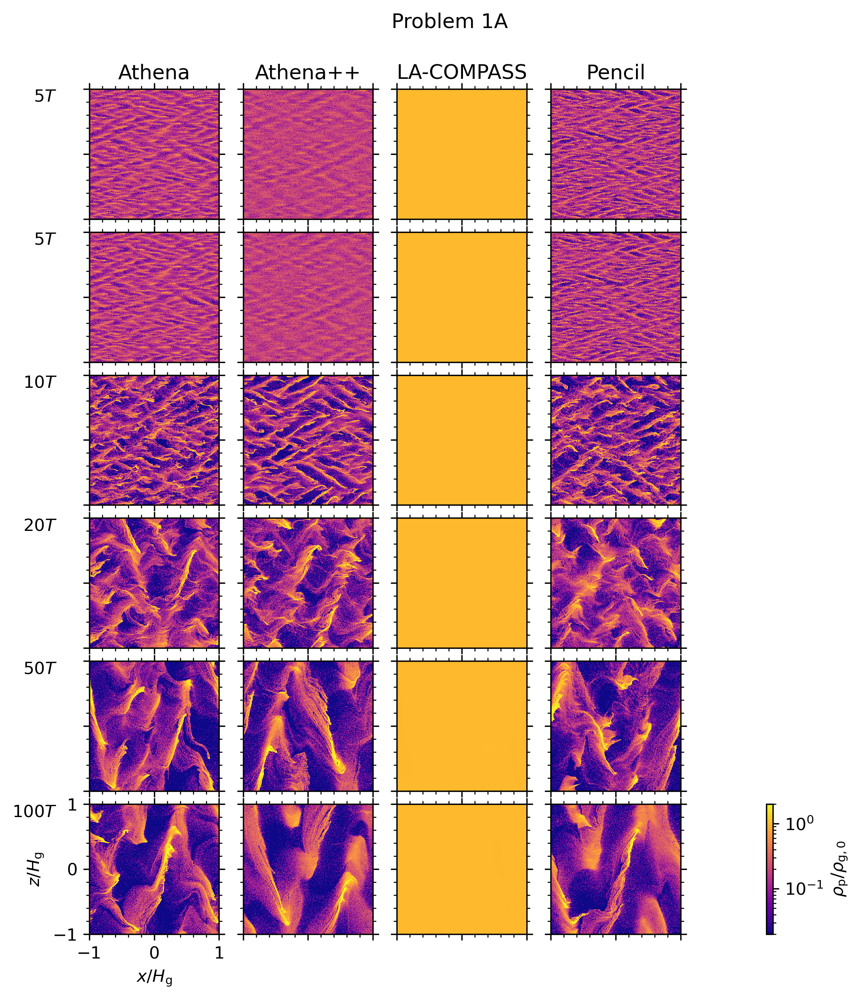

In [13]:
#==============================================================================
import sys
sys.path.insert(0, '/home/stanley/bitbucket/ccyang/athena-dust/vis/python')
import athena_read
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import numpy as np

codes = ['Athena', 'Athena++', 'LA-COMPASS', 'Pencil']
times = ['5', '5', '10', '20', '50', '100']
fig, axs = plt.subplots(len(times), len(codes)+1, figsize=(8, 9), dpi=300)
fig.suptitle('Problem 1A', y=0.95)
problem = 'problem1'
subprob = 'a'
base = f'/home/stanley/github/sabaronett/sicc/data/{problem}/{subprob}'
vmin, vmax = 2e-2, 2e0 # BA CPDD > 85%; CPDD < 5%

for j, code in enumerate(codes):
    path = f'{base}/{code}'
    axs[0][j].set_title(code)
    grid = np.load(f'{path}/grid.npz')
    for i, time in enumerate(times):
        rhop = np.load(f'{path}/rhop{time}.npz')['rhop']
        clip = np.clip(rhop, vmin, vmax)
        mesh = axs[i][j].pcolormesh(grid['x'], grid['z'], clip,
                                    norm=colors.LogNorm(vmin=vmin, vmax=vmax),
                                    cmap='plasma', rasterized=True)
        # fig.colorbar(mesh, ax=axs[i][j], pad=0.058,
        #              label=r'$\rho_\mathrm{p}/\rho_\mathrm{g,0}$')
        axs[i][j].set(aspect='equal')
        if j == 0:
            axs[i][j].text(-1.5, 1, f'${time}T$', ha='right', va='top')
            if i != len(times)-1:
                axs[i][j].get_yaxis().set_ticklabels([])
                fig.delaxes(axs[i][-1])
        else:
            axs[i][j].get_xaxis().set_ticklabels([])

# Format
for ax in axs.flat:
    ax.label_outer()
    ax.minorticks_on()
    ax.tick_params(axis='both', which='both', top=True, right=True)
axs[-1][0].set(xlabel=r'$x/H_\mathrm{g}$', ylabel=r'$z/H_\mathrm{g}$')
axs[-1][-1].set(frame_on=True, aspect=10)
fig.colorbar(mesh, cax=axs[-1][-1], label=r'$\rho_\mathrm{p}/\rho_\mathrm{g,0}$')
fig.subplots_adjust(wspace=0.1, hspace=0.1)

# fig.colorbar(mesh, ax=axs[-1][0], pad=0)
# axs[-1][0].text(1.3, -1, r'$\rho_\mathrm{p}/\rho_\mathrm{g,0}$')
# fig.suptitle('Problem 1A', y=1)
# fig.tight_layout()

# plt.savefig(f'figs/{problem}-{subproblem}.png', bbox_inches='tight',
#             pad_inches=0.01)

### D

In [105]:
problem = 'problem1'
subprob = 'd'
base = f'/home/stanley/github/sabaronett/sicc/data/{problem}/{subprob}'
code = 'Athena++'
times = ['5', '10', '20', '50', '100']
# time = 5
path = f'{base}/{code}'
# data = np.load(f'{path}/old/data_coordinates_dust_rho_{time:03.0f}_orbits.npz')
# data['x_coord']['z_coord']

for time in times:
    rhop = np.load(f'{path}/old/data_coordinates_dust_rho_{time:03.0f}_orbits.npz')['rho_d']
    np.savez_compressed(f'{path}/rhop{time}', rhop=rhop)

NpzFile '/home/stanley/github/sabaronett/sicc/data/problem1/d/Athena++/old/data_coordinates_dust_rho_005_orbits.npz' with keys: rho_d, x_coord, z_coord

FileNotFoundError: [Errno 2] No such file or directory: '/home/stanley/github/sabaronett/sicc/data/problem1/a/FARGO-3D/grid.npz'

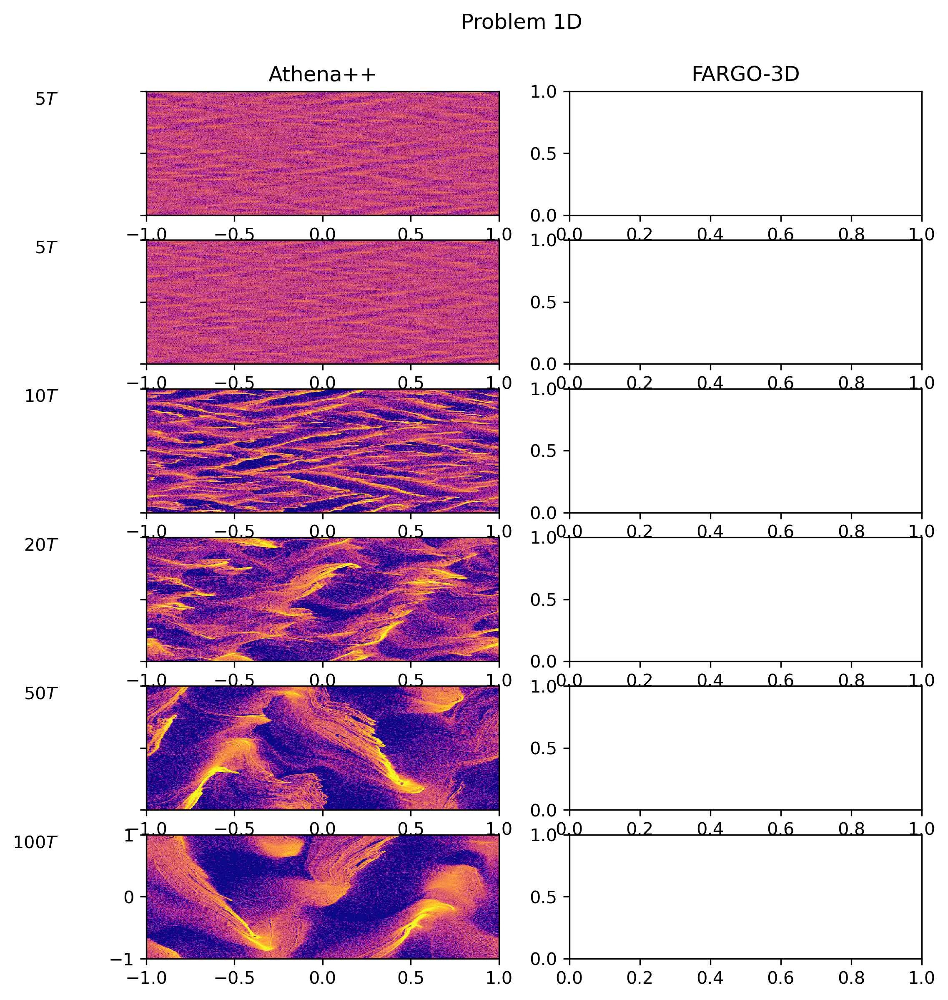

In [112]:
#==============================================================================
import sys
sys.path.insert(0, '/home/stanley/bitbucket/ccyang/athena-dust/vis/python')
import athena_read
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import numpy as np

codes = ['Athena++', 'FARGO-3D']
times = ['5', '5', '10', '20', '50', '100']
fig, axs = plt.subplots(len(times), len(codes), figsize=(8, 9), dpi=300)
fig.suptitle('Problem 1D', y=0.95)
problem = 'problem1'
subprob = 'a'
base = f'/home/stanley/github/sabaronett/sicc/data/{problem}/{subprob}'
vmin, vmax = 2e-2, 2e0 # BA CPDD > 85%; CPDD < 5%

for j, code in enumerate(codes):
    path = f'{base}/{code}'
    axs[0][j].set_title(code)
    grid = np.load(f'{path}/grid.npz')
    for i, time in enumerate(times):
        rhop = np.load(f'{path}/rhop{time}.npz')['rhop']
        clip = np.clip(rhop, vmin, vmax)
        mesh = axs[i][j].pcolormesh(grid['x'], grid['z'], clip,
                                    norm=colors.LogNorm(vmin=vmin, vmax=vmax),
                                    cmap='plasma', rasterized=True)
        # fig.colorbar(mesh, ax=axs[i][j], pad=0.058,
        #              label=r'$\rho_\mathrm{p}/\rho_\mathrm{g,0}$')
        if j == 0:
            # axs[i][j].text(-1.5, 0, f'${time}T$', ha='center', va='center',
            #                rotation='vertical')
            axs[i][j].text(-1.5, 1, f'${time}T$', ha='right', va='top')
            if i != len(times)-1:
                axs[i][j].get_yaxis().set_ticklabels([])

# Format
for ax in axs.flat:
    ax.label_outer()
    ax.minorticks_on()
    ax.set(aspect='equal')
    ax.tick_params(axis='both', which='both', top=True, right=True)
axs[-1][0].set(xlabel=r'$x/H_\mathrm{g}$', ylabel=r'$z/H_\mathrm{g}$')
# fig.colorbar(mesh, ax=axs[-1][0], pad=0)
# axs[-1][0].text(1.4, -1, r'$\rho_\mathrm{p}/\rho_\mathrm{g,0}$', rotation=270,
#                 va='center')

fig.colorbar(mesh, ax=axs[0], fraction=0.45, location='top'), #pad=5.0)
axs[-1][0].text(-1.5, 0, r'$\rho_\mathrm{p}/\rho_\mathrm{g,0}$', ha='center',
                va='center', rotation='vertical')
fig.subplots_adjust(wspace=0.1, hspace=0.1)

# fig.colorbar(mesh, ax=axs[-1][0], pad=0)
# axs[-1][0].text(1.3, -1, r'$\rho_\mathrm{p}/\rho_\mathrm{g,0}$')
# fig.tight_layout()

# plt.savefig(f'figs/{problem}-{subproblem}.png', bbox_inches='tight',
#             pad_inches=0.01)